# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  
  
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

Файл *moscow_places.csv*:
  
*name* — название заведения;  
*address* — адрес заведения;  
*category* — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
*hours* — информация о днях и часах работы;  
*lat* — широта географической точки, в которой находится заведение;  
*lng* — долгота географической точки, в которой находится заведение;  
*rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
*price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
*avg_bill* — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽».
- и так далее;  

*middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  

*middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца *avg_bill*, начинающихся с подстроки «Цена одной чашки капучино»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  

*chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым  

*district* — административный район, в котором находится заведение, например Центральный административный округ;  
*seats* — количество посадочных мест.

## Знакомство с данными

Загрузим библиотеки.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime as dt
import os
from plotly import graph_objects as go
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

Загрузим данные.

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    
pd.options.display.max_colwidth = 150

Посмотрим несколько строк из таблицы.

In [3]:
data.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1960,ДаблБи,кофейня,"Москва, Весковский переулок, 3",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.778685,37.599285,4.4,NaN,NaN,NaN,NaN,1,24.0
2867,Кебаб-хауз,булочная,"Москва, Тагильская улица, 4, стр. 15",Восточный административный округ,"ежедневно, круглосуточно",55.819069,37.751755,3.9,средние,Средний счёт:от 300 ₽,300.0,NaN,0,40.0
8105,Vcafe,кофейня,"Москва, 7-я Кожуховская улица, 9",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.710627,37.675563,4.2,NaN,NaN,NaN,NaN,0,120.0
2643,Русские пончики,быстрое питание,"Москва, Измайловское шоссе, 71, стр. 10",Восточный административный округ,"ежедневно, 07:00–23:00",55.789406,37.748348,4.7,NaN,NaN,NaN,NaN,0,30.0
6555,Кафе-бар Сити,"бар,паб","Москва, улица Миклухо-Маклая, 17",Юго-Западный административный округ,"ежедневно, 10:00–01:00",55.651902,37.506083,4.4,средние,Средний счёт:до 1000 ₽,1000.0,NaN,0,48.0
6584,Курица и Утка по-Гонконгски,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661598,37.480319,4.3,NaN,NaN,NaN,NaN,0,NaN
2259,Между Булок,кафе,"Москва, Бакунинская улица, 69, стр. 1",Центральный административный округ,"ежедневно, 10:00–21:00",55.779145,37.690709,4.3,средние,Средний счёт:300–500 ₽,400.0,NaN,0,160.0


Посмотрим общую информацию.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data['name'].nunique()

5614

В таблице представлены данные о 5614 заведениях.  
Таблица содержит 14 колонок, из них 6 колонок типа *float64* (*lat*, *lng*, *rating*, *middle_avg_bill*, *middle_coffee_cup*, *seats*), 1 колонка типа *int64* (*chain*) и 7 колонок типа *object* (*name*, *category*, *address*, *district*, *hours*, *price*, *avg_bill*).  
Колонка *seats* имеет тип данных *float64*, но здесь больше подойдёт тип *int64*, так как не бывает 1.3 сидячих мест.  
Названия в данных нужно привести к одному регистру.

Приведём к нижнему регистру все названия.

In [6]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()

Проверим.

In [7]:
data.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1865,coffeeshots,кофейня,"москва, улица правды, 24с4",Северный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.789598,37.583553,4.3,NaN,цена чашки капучино:100–170 ₽,NaN,135.0,1,NaN
5830,яндекс лавка,ресторан,"москва, улица ватутина, 18, корп. 2",Западный административный округ,"ежедневно, 07:00–00:00",55.722546,37.452088,3.9,NaN,NaN,NaN,NaN,1,NaN
5915,буркина фасоль,кафе,"москва, ленинский проспект, 39с1",Юго-Западный административный округ,"ежедневно, 08:00–23:00",55.707812,37.583407,4.3,NaN,NaN,NaN,NaN,1,NaN
3868,пальмира,кафе,"москва, улица малая дмитровка, 2",Центральный административный округ,"ежедневно, 09:00–00:00",55.766682,37.607029,4.5,NaN,NaN,NaN,NaN,0,NaN
5416,колос,кофейня,"москва, вольная улица, 28/4к1",Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.776337,37.736292,3.9,NaN,NaN,NaN,NaN,0,NaN
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
5741,буфет ботанического сада,кафе,"москва, ботанический сад московского государственного университета",Западный административный округ,"ежедневно, 10:00–20:00",55.705555,37.523839,4.3,NaN,NaN,NaN,NaN,0,NaN


## Предобработка данных

### Поиск дубликатов

Проверим явные дубликаты.

In [8]:
data.duplicated().sum()

0

Проверим не явные дубликаты.  
Дубликатами будем считать совпадения в столбцах с названием и адресом.

In [9]:
data.duplicated(subset = ['name', 'address']).sum()

4

Всего 4 дубликата - удалим их.

In [10]:
data = data.drop_duplicates(subset = ['name', 'address'])

Проверим.

In [11]:
data.duplicated(subset = ['name', 'address']).sum()

0

### Пропуски

In [12]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Пропусков достаточно много - удалить их не получится.  
В столбце *hours* заполнить пропуски не получится, так как график работы заведения зависит от многих показателей.  
В столбце *seats* заполнить пропуски тоже не получится, так как количество мест зависит от площади гостевого зала заведения.  
В столбце *price* тоже не получится заполнить пропуски, так как мы не знаем ценовые значения заведений.  
Не получится заполнить пропуски и в столбце *avg_bill*, так как в каждом заведении своя стоимость среднего заказа, а на основании этого мы не сможем заполнить пропуски и в столбце *middle_avg_bill*, так как средняя стоимость заказа получается на основе данных столбца *avg_bill*.  
Так же обстоят дела и со столбцом *middle_coffee_cup* в который входят данные из столбца *avg_bill*.  
  
На основании этого пропуски оставляем.

### Создание столбцов

Создайте столбец *street* с названиями улиц из столбца с адресом.

In [13]:
data['street'] = data['address'].str.split(', ').str[1]
data.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
4311,coffee point,кафе,"москва, улица раевского, 4, стр. 1а",Западный административный округ,пн-чт 08:00–19:00; пт 08:00–18:00,55.744982,37.551888,4.0,низкие,средний счёт:50–250 ₽,150.0,NaN,1,NaN,улица раевского
2863,кафе подзонти.com,кафе,"москва, малая семёновская улица, 28, стр. 19",Восточный административный округ,"ежедневно, 10:00–22:00",55.784374,37.714770,4.0,NaN,средний счёт:300–1000 ₽,650.0,NaN,0,10.0,малая семёновская улица
4806,marrakesh,ресторан,"москва, неглинная улица, 10",Центральный административный округ,"ежедневно, 12:00–06:00",55.761890,37.620320,4.3,выше среднего,средний счёт:1000–1500 ₽,1250.0,NaN,0,120.0,неглинная улица
7729,кафе,столовая,"москва, варшавское шоссе, 145, корп. 8",Южный административный округ,"ежедневно, 07:00–22:00",55.578574,37.602570,3.7,NaN,NaN,NaN,NaN,0,20.0,варшавское шоссе
1169,на перекус,кафе,"москва, снежная улица, 26",Северо-Восточный административный округ,NaN,55.855150,37.653301,4.2,NaN,NaN,NaN,NaN,0,210.0,снежная улица
5482,ип федорова е. е.,кафе,"москва, шоссе энтузиастов, 86, стр. 7",Восточный административный округ,NaN,55.762622,37.797469,4.1,NaN,NaN,NaN,NaN,0,NaN,шоссе энтузиастов
7104,канти,пиццерия,"москва, кантемировская улица, 18, корп. 5, стр. 2",Южный административный округ,"ежедневно, 10:00–21:00",55.640974,37.664435,4.8,NaN,NaN,NaN,NaN,0,NaN,кантемировская улица


Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [14]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'
data.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
5838,кафе,кафе,"москва, улица горбунова, 12, корп. 2, стр. 5",Западный административный округ,NaN,55.726646,37.380350,3.8,NaN,NaN,NaN,NaN,0,NaN,улица горбунова,False
860,донер в пите,быстрое питание,"москва, бескудниковский бульвар, 12с1",Северный административный округ,"ежедневно, круглосуточно",55.862445,37.562265,3.7,NaN,NaN,NaN,NaN,1,NaN,бескудниковский бульвар,True
3704,винил и вино,"бар,паб","москва, улица каретный ряд, 8",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–05:00; вс 12:00–00:00",55.772747,37.609668,4.7,высокие,NaN,NaN,NaN,0,NaN,улица каретный ряд,False
7848,столовая,кафе,"москва, мелитопольская улица, 7",Южный административный округ,"ежедневно, 11:00–17:00",55.586312,37.629874,3.7,NaN,NaN,NaN,NaN,0,30.0,мелитопольская улица,False
5850,vip wok and sushi,быстрое питание,"москва, можайское шоссе, 45б",Западный административный округ,"ежедневно, 11:00–23:00",55.716420,37.406693,4.2,NaN,NaN,NaN,NaN,0,16.0,можайское шоссе,False
1930,пороселло,"бар,паб","москва, сущёвская улица, 21, стр. 7",Центральный административный округ,"ежедневно, круглосуточно",55.782330,37.599788,4.4,выше среднего,цена бокала пива:от 350 ₽,NaN,NaN,1,60.0,сущёвская улица,True
6885,зандукели,кафе,"москва, чертановская улица, 9, стр. 4",Южный административный округ,"пн-пт 11:00–00:00; сб,вс 11:00–02:00",55.629536,37.600259,4.4,выше среднего,средний счёт:1000–1500 ₽,1250.0,NaN,1,40.0,чертановская улица,False


## Анализ данных

### Категории заведений

Какие категории заведений представлены в данных?  
Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.  
Постройте визуализации.  
Ответьте на вопрос о распределении заведений по категориям.

Посмотрим какие категории представлены в данных.

In [15]:
print('Названия категорий:', data['category'].unique())
print()
print('Количество категорий:', data['category'].nunique())

Названия категорий: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']

Количество категорий: 8


Посмотрим распределение заведений по категориям.

In [16]:
data['category'].value_counts()

category
кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

Построим график.

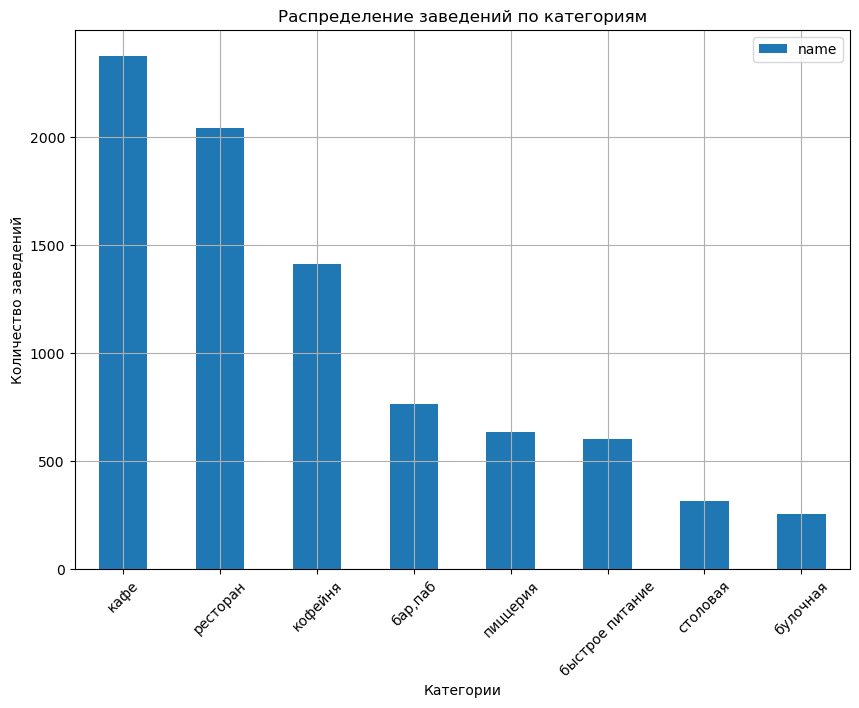

In [17]:
category_count = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
category_count.plot(kind = 'bar', figsize=(10, 7))
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

В данных мы имеем 8 категорий: "кафе", "ресторан", "кофейня", "пиццерия", "бар, паб", "быстрое питание", "булочная", "столовая". 
  
Самые большии категории это "кафе" (2376) и "ресторан" (2042), наименьшии "столовая" (315) и "булочная" (256).

### Посадочные местa

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.  
Постройте визуализации.  
Проанализируйте результаты и сделайте выводы.

Посмотрим распредиление записей по категориям.

In [18]:
category_name = data.groupby('category')['seats'].count().reset_index()
category_name.columns = ['category', 'count']
category_name

,category,count
0,"бар,паб",467
1,булочная,148
2,быстрое питание,349
3,кафе,1217
4,кофейня,751
5,пиццерия,427
6,ресторан,1269
7,столовая,164


In [19]:
print('Всего записей о посадочных местах - ', category_name['count'].sum())

Всего записей о посадочных местах -  4792


Построим график медианого количества сидячих мест по категориям.

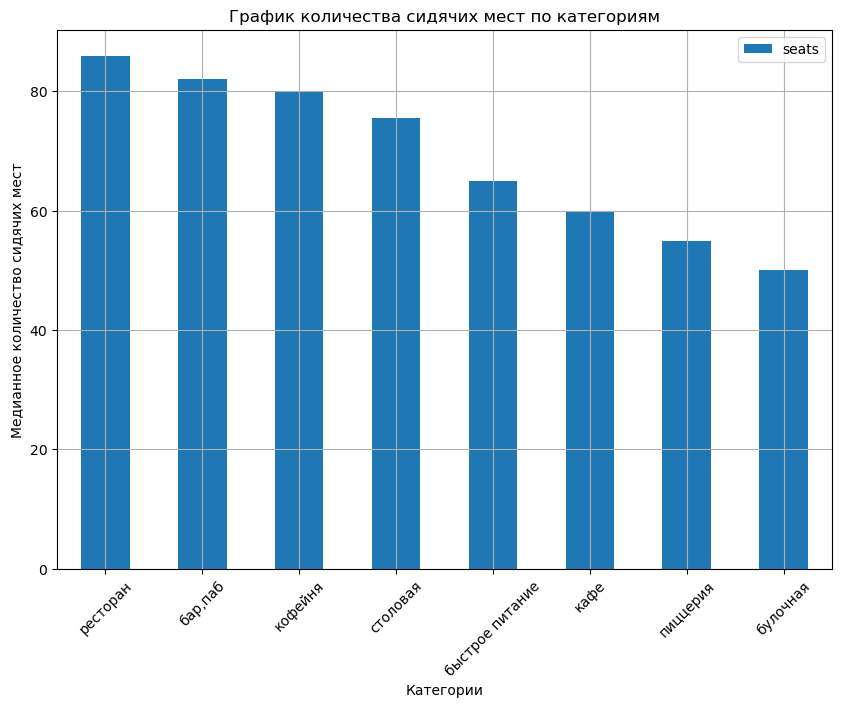

In [20]:
seats_count = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False)
seats_count.plot(kind = 'bar', figsize=(10, 7))
plt.title('График количества сидячих мест по категориям')
plt.ylabel('Медианное количество сидячих мест')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Всего у нас 4792 записи в данных о сидячих местах.  
Больше всего записей в категориях "ресторан" (1269) и "кафе" (1217).  
Меньше всего записей в категориях "столовая" (164) и "булочная" (148).  
Наибольшее медианное количество посадочных мест 80 - 85 в категориях "ресторан", "бар, паб" и "кофейня", далее 60 - 75 мест в категориях "столовая", "быстрое питание" и "кафе", наименьшее количество сидячих мест 50 - 55 в категориях "пиццерия", "булочная".

### Сетевые и несетевые заведения

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете.  
Каких заведений больше?

Для удобства заменим обозначения 0 и 1 на "не сетевой" и "сетевой".

In [21]:
data['chain'] = data['chain'].replace(0, 'не сетевой')
data['chain'] = data['chain'].replace(1, 'сетевой')
data.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
5537,лефорт,кафе,"москва, юрьевский переулок, 16а",Юго-Восточный административный округ,NaN,55.765244,37.717292,4.9,NaN,NaN,NaN,NaN,не сетевой,20.0,юрьевский переулок,False
2970,бутерброд,кафе,"москва, вернисажная улица, 13",Восточный административный округ,"ежедневно, 09:00–20:00",55.800605,37.747720,3.9,NaN,NaN,NaN,NaN,не сетевой,NaN,вернисажная улица,False
1979,лахинкали,ресторан,"москва, планетная улица, 45",Северный административный округ,"ежедневно, 11:00–00:00",55.805571,37.539494,4.3,NaN,NaN,NaN,NaN,не сетевой,NaN,планетная улица,False
5832,пекарня буханка,булочная,"москва, 2-й переулок петра алексеева, 5",Западный административный округ,"ежедневно, 09:00–20:00",55.717888,37.429627,4.5,NaN,NaN,NaN,NaN,сетевой,NaN,2-й переулок петра алексеева,False
8098,кухня гастро-паб,"бар,паб","москва, новоданиловская набережная, 6, корп. 1",Южный административный округ,пн-пт 08:00–22:00,55.698129,37.625198,4.2,выше среднего,NaN,NaN,NaN,не сетевой,200.0,новоданиловская набережная,False
3217,протесто,кафе,"москва, улица василисы кожиной, 1",Западный административный округ,пн-пт 09:00–18:00,55.737486,37.506169,4.2,NaN,NaN,NaN,NaN,не сетевой,49.0,улица василисы кожиной,False
1562,декафудс,кафе,"москва, большая академическая улица, 5",Северный административный округ,пн-пт 09:00–17:00,55.818622,37.522228,3.6,NaN,NaN,NaN,NaN,не сетевой,NaN,большая академическая улица,False


Построим график.

In [22]:
chain = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain.columns = ['chain', 'count']
fig = go.Figure(data = [go.Pie(labels = chain['chain'], values = chain['count'])])
fig.update_layout(title = 'Соотношение "сетевых" и "несетевых" заведений')
fig.show()

Не сетевых заведений больше, их 61.9%, соответственно сетевых 38.1%.

### Сетевые категории заведений

Какие категории заведений чаще являются сетевыми?  
Исследуйте данные и ответьте на вопрос графиком.

Сделаем срез данных.

In [23]:
chain_set = data.query('chain == "сетевой"').pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
chain_set_merge = category_count.merge(chain_set, how = 'left', on = 'category').reset_index()
chain_set_merge.columns = ['category', 'count', 'chain']
chain_set_merge['percent'] = round(chain_set_merge['chain'] / chain_set_merge['count'] * 100, 1)
chain_set_merge

,category,count,chain,percent
0,кафе,2376,779,32.8
1,ресторан,2042,729,35.7
2,кофейня,1413,720,51.0
3,"бар,паб",764,168,22.0
4,пиццерия,633,330,52.1
5,быстрое питание,603,232,38.5
6,столовая,315,88,27.9
7,булочная,256,157,61.3


Построим график.

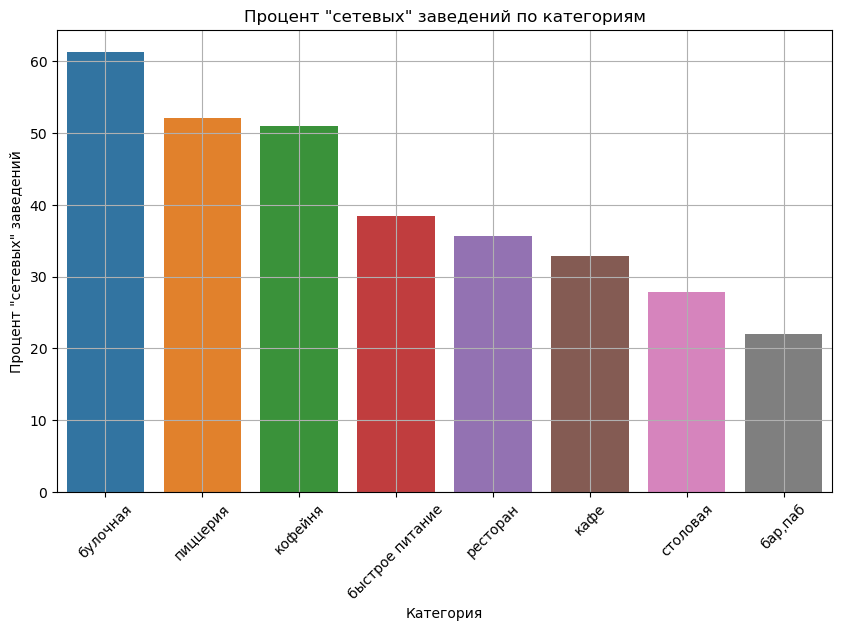

In [24]:
plt.figure(figsize = (10, 6))
sns.barplot(x = 'category', 
            y = 'percent', 
            data = chain_set_merge.sort_values(by = 'percent', ascending = False))
plt.title('Процент "сетевых" заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Процент "сетевых" заведений')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

### Топ-15 популярных сетей в Москве

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.  
Постройте подходящую для такой информации визуализацию.  
Знакомы ли вам эти сети?  
Есть ли какой-то признак, который их объединяет?  
К какой категории заведений они относятся?

Группируем данные.

In [25]:
top_chain = data.query('chain == "сетевой"').pivot_table(index = 'name', values = 'chain', aggfunc = 'count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
top_chain

,name,chain
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


Строим график.

In [26]:
fig = px.bar(top_chain, x = 'name', y = 'chain', title = 'Топ-15 сетевых заведений')
fig.update_layout(xaxis_title = 'Название заведения',
                  yaxis_title = 'Количество заведений в сети')
fig.update_xaxes(tickangle = 45)
fig.show()

Самые популярные сетевые заведения это "Шоколадница" (120), "Домино'с пицца" (76) и "Додо пицца" (74).  
Эти сети хорошо известны.

Посмотрим какие сети к каким категориям относятся.

In [27]:
data_chain = data[data['chain'] == 'сетевой']
top_15 = data_chain.groupby('name').agg({'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns = {'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,category,count
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [28]:
top_chain = data_chain.groupby(['name', 'category']).agg({'address' : 'count'})
top_chain = top_chain.sort_values('address', ascending = False).reset_index()
top_chain = top_chain.rename(columns = {'address':'count'})
top_chain = top_chain[top_chain['name'].isin(top_15['name'])]
top_chain.head()

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69


In [29]:
fig = px.bar(top_chain.sort_values(by = 'name', ascending=True), 
             x = 'count',
             y = 'name',               
             color = 'category',
             text='count'
            )
fig.update_layout(legend = dict(title = "Категория"),
                   title = 'Топ 15 сетей по количеству заведений в категориях',
                   xaxis_title = 'Количество заведений',
                   yaxis_title = 'Название сети',  
                   yaxis = {'categoryorder':'total ascending'},
                   width = 1000, 
                   height = 550
                 )
fig.show()

По количеству заведений лидируют сети которые представленны в одной категории ("Домино'с пицца", "Додо пицца"), но сетей которые представленны хотябы в двух категориях восемь из пятнадцати и в их числе самая большая сеть "Шоколадница".

### Административные районы Москвы

Какие административные районы Москвы присутствуют в датасете?  
Отобразите общее количество заведений и количество заведений каждой категории по районам.  
Попробуйте проиллюстрировать эту информацию одним графиком.

Посмотрим какие административные районы присутствуют в данных.

In [30]:
print('В данных присутствуют:', data['district'].unique())

В данных присутствуют: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


Посмотрим распределение заведений в округах по категориям.

In [31]:
district_category = data.groupby(['district','category'], as_index = False)['name'].count()
district_category.sort_values(by = 'name', ascending = False)

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


Построим график.

In [32]:
fig = px.bar(district_category.sort_values(by = 'name', ascending=True), 
             x = 'name',
             y = 'district',               
             color = 'category'
            )
fig.update_layout(legend = dict(title = "Категория"),
                   title = 'Количество заведений каждой категории по районам',
                   xaxis_title = 'Количество заведений',
                   yaxis_title = 'Район',  
                   yaxis = {'categoryorder':'total ascending'},
                   width = 1000, 
                   height = 550
                 )
fig.show()

Большая часть заведений по всем категориям находится в Центральном административном округе.  
Меньше всего заведений расположенно в Северо - Западном административном округе.

### Визуализируйте распределение средних рейтингов по категориям заведений

Визуализируйте распределение средних рейтингов по категориям заведений.  
Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [33]:
rating_s = data.pivot_table(index = 'category', values = 'rating').reset_index()
rating_s['rating'] = round(rating_s['rating'],2)
rating_s.sort_values(by = 'rating', ascending = False)

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [34]:
fig = px.bar(rating_s.sort_values(by = 'rating', ascending = False), x = 'rating', y = 'category', text = 'rating', color = 'category')
fig.update_layout(showlegend = False,
                  title = 'Распределение средних рейтингов по категориям заведений',
                  xaxis_title = "Рейтинг",
                  yaxis_title = "Категории заведений",
                  )
fig.update_xaxes(range = [4, 4.4])
fig.show()

По категориям среднии рейтинги не сильно отличаются и находятся в диапазоне от 4.05 до 4.39.

### Фоновая картограмма (хороплёт) со средним рейтингом заведений каждого района

Постройте фоновую картограмму (хороплёт) со средним рейтингом заведений каждого района.  
Границы районов Москвы, которые встречаются в датасете, хранятся в файле *admin_level_geomap.geojson*. 

Посмотрим средние рейтинги по районам.

In [35]:
rating_district = data.groupby('district', as_index = False)['rating'].agg('mean')
rating_district = round(rating_district, 2).sort_values(by = 'rating', ascending = False)
rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Загружаем *JSON*-файл с границами округов Москвы.

In [36]:
# try:
   # state_geo = '/datasets/admin_level_geomap.geojson'
# except:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = rating_district,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг в Центральном административном округе - 4.38.  
Самый низкий рейтинг в Юго - Восточном административном округе - 4.10.

### Все заведения датасета на карте

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки *folium*.

In [38]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']], popup = f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis = 1)
 
# выводим карту
m

На кластерах видно что самое большое количество заведений расположились в центре Москвы и чам ближе к окраинам тем их меньше.

### Топ-15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений.  
Постройте график распределения количества заведений и их категорий по этим улицам.  
Попробуйте проиллюстрировать эту информацию одним графиком.

Найдём топ - 15 улиц.

In [39]:
top_street = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index().head(15)
top_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Распределим по категориям

In [40]:
street = top_street['street']
street_per_category = data.query("street in @street").groupby(['street', 'category']).agg(count = ('category', 'count')).reset_index()
street_per_category.sort_values(by = 'count', ascending = False)

,street,category,count
78,проспект мира,кафе,53
63,мкад,кафе,45
81,проспект мира,ресторан,45
79,проспект мира,кофейня,36
86,профсоюзная улица,кафе,35
...,...,...,...
58,люблинская улица,пиццерия,1
68,проспект вернадского,булочная,1
66,мкад,столовая,1
23,кутузовский проспект,булочная,1


In [41]:
fig = px.bar(street_per_category.sort_values(by = 'count', ascending = False), 
             x = 'street', 
             y = 'count', 
             color = 'category')
fig.update_layout(legend = dict(title = "Категория"),
                  title = 'Количество заведений каждой категории по районам',
                  xaxis_title = 'Район',
                  yaxis_title = 'Количество заведений',
                  height = 800,
                  width = 1000,
                  xaxis = {'categoryorder':'total descending'})
fig.show()

Наибольшее количество заведений находится на "Проспекте мира" (183), "Профсоюзная улица" (122) и "Проспект Вернадского" (108).  
Наименьшее количество заведений находится на "Кутузовский проспект" (54), "Улица Миклухо - Маклая" (49) и "Пятницкая улица" (48).

### Улицы, на которых находится только один объект общепита

Найдите улицы, на которых находится только один объект общепита.  
Что можно сказать об этих заведениях?

In [42]:
street_one = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query("name == 1").reset_index()
only_street = street_one['street']
data_only_street = data.query("street in @only_street")
data_only_street.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3985,му-му,ресторан,"москва, троилинский переулок, 5",Центральный административный округ,пн-сб 09:00–22:00; вс 09:00–21:00,55.748231,37.583738,4.2,средние,средний счёт:450 ₽,450.0,NaN,сетевой,NaN,троилинский переулок,False
270,guru,ресторан,"москва, челюскинская улица, 11с1",Северо-Восточный административный округ,"ежедневно, 11:00–23:00",55.883371,37.704806,4.2,NaN,NaN,NaN,NaN,не сетевой,NaN,челюскинская улица,False
4558,ex: libris,кафе,"москва, бобров переулок, 6, стр. 2",Центральный административный округ,"ежедневно, 11:00–23:00",55.764983,37.634254,4.4,средние,средний счёт:600–800 ₽,700.0,NaN,не сетевой,NaN,бобров переулок,False
324,иду лесом,кофейня,"москва, светлогорский проезд, 13, стр. 7",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.848242,37.402168,5.0,средние,цена чашки капучино:150–180 ₽,NaN,165.0,не сетевой,NaN,светлогорский проезд,False
4152,e. d. a.,ресторан,"москва, 1-й спасоналивковский переулок, 8, стр. 2",Центральный административный округ,пт 15:00–17:00,55.733300,37.616710,4.7,NaN,NaN,NaN,NaN,не сетевой,14.0,1-й спасоналивковский переулок,False
2435,хаят,кафе,"москва, выползов переулок, 7, стр. 2",Центральный административный округ,"ежедневно, 10:00–19:00",55.779430,37.626998,4.0,NaN,NaN,NaN,NaN,сетевой,68.0,выползов переулок,False
5156,abc coffee roasters,кофейня,"москва, ордынский тупик, 4а",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.741026,37.623384,4.5,NaN,NaN,NaN,NaN,сетевой,NaN,ордынский тупик,False


In [43]:
print('Всего улиц где есть только одно заведение общепита - ', len(data_only_street))

Всего улиц где есть только одно заведение общепита -  457


Посмотрим их расположение на карте.

In [44]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']], popup = f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_only_street.apply(create_clusters, axis = 1)
 
# выводим карту
m

Посмотрим их распределение по категориям.

In [45]:
street_one = data_only_street.groupby('category')['seats'].count().reset_index()
street_one.columns = ['category', 'count']
street_one.sort_values(by = 'count', ascending = False)

,category,count
3,кафе,47
6,ресторан,42
4,кофейня,18
0,"бар,паб",14
7,столовая,14
5,пиццерия,9
2,быстрое питание,7
1,булочная,5


Больше всего заведений в категориях "кафе" (47) и "ресторан" (42).  
Меньше всего заведений в категориях "быстрое питание" (7) и "булочная" (5).

Посмотрим распределение заведений по округам.

In [46]:
district_one = data_only_street.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
district_one

,district,name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,51
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [47]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = district_one,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Наибольшее количество заведений находится в "Центральном административном округе".  
Наименьшее количество заведений находится в "Юго - Западном административном округе".

Посмотрим сколько из них сетевых и не сетевых.

In [48]:
chain_one = data_only_street.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain_one.columns = ['chain', 'count']
chain_one

,chain,count
0,не сетевой,324
1,сетевой,133


In [49]:
fig = go.Figure(data = [go.Pie(labels = chain_one['chain'], values = chain_one['count'])])
fig.update_layout(title = 'Соотношение "сетевых" и "несетевых" заведений')
fig.show()

In [50]:
print('Процент улиц на которых есть всего одно заведение составляет -',
round(data_only_street['street'].nunique() / data['street'].nunique() * 100, 2),'%')

Процент улиц на которых есть всего одно заведение составляет - 31.58 %


### Значения средних чеков

Значения средних чеков заведений хранятся в столбце *middle_avg_bill*.  
Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном.  
Посчитайте медиану этого столбца для каждого района.  
Используйте это значение в качестве ценового индикатора района.  
Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.  
Проанализируйте цены в центральном административном округе и других.  
Как удалённость от центра влияет на цены в заведениях?

Считаем медиану для каждого района.

In [51]:
district_median = data.groupby('district', as_index = False)['middle_avg_bill'].agg('median')
district_median = round(district_median, 2).sort_values(by = 'middle_avg_bill', ascending = False)
district_median

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Строим хороплёт.

In [52]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = district_median,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самый большой средний чек в Центральном и Западном административных округах (1000р).  
Самый маленький средний чек в Юго - Восточном административном округе (450р).  
В остальных округах средний чек находится в диапазоне от 500р до 700р.  
На основании этого можно сказать что удалённость от центра практически не влияет на цены.

### Вывод

Соберите наблюдения по вопросам выше в один общий вывод.

- В данных мы имеем 8 категорий: "кафе", "ресторан", "кофейня", "пиццерия", "бар, паб", "быстрое питание", "булочная", "столовая". Самые большии категории это "кафе" (2376) и "ресторан" (2042), наименьшии "столовая" (315) и "булочная" (256).  
  
- Всего у нас 4792 записи в данных о сидячих местах. Больше всего записей в категориях "ресторан" (1269) и "кафе" (1217). Меньше всего записей в категориях "столовая" (164) и "булочная" (148). Наибольшее медианное количество посадочных мест 80 - 85 в категориях "ресторан", "бар, паб" и "кофейня", далее 60 - 75 мест в категориях "столовая", "быстрое питание" и "кафе", наименьшее количество сидячих мест 50 - 55 в категориях "пиццерия", "булочная".  
  
-   Не сетевых заведений больше, их 61.9%, соответственно сетевых 38.1%.  
  
- Самые популярные сетевые заведения это "Шоколадница" (120), "Домино'с пицца" (76) и "Додо пицца" (74). Эти сети хорошо известны.  
По количеству заведений лидируют сети которые представленны в одной категории ("Домино'с пицца", "Додо пицца"), но сетей которые представленны хотябы в двух категориях восемь из пятнадцати и в их числе самая большая сеть "Шоколадница". 
  
- В данных присутствуют: 'Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ'. Большая часть заведений по всем категориям находится в Центральном административном округе. Меньше всего заведений расположенно в Северо - Западном административном округе.
  
- По категориям среднии рейтинги не сильно отличаются и находятся в диапазоне от 4.05 до 4.39.  
  
- Наибольшее количество заведений находится на "Проспекте мира" (183), "Профсоюзная улица" (122) и "Проспект Вернадского" (108). Наименьшее количество заведений находится на "Кутузовский проспект" (54), "Улица Миклухо - Маклая" (49) и "Пятницкая улица" (48).  
  
- Всего улиц где есть только одно заведение общепита -  457, из них 324 заведения не являются сетевыми, а сетевых всего 133. Больше всего заведений в категориях "кафе" (47) и "ресторан" (42). Меньше всего заведений в категориях "быстрое питание" (7) и "булочная" (5). Наибольшее количество заведений находится в "Центральном административном округе". Наименьшее количество заведений находится в "Юго - Западном административном округе". Процент улиц на которых есть всего одно заведение составляет - 31.58 %.  
  
- Самый большой средний чек в Центральном и Западном административных округах (1000р). Самый маленький средний чек в Юго - Восточном административном округе (450р). В остальных округах средний чек находится в диапазоне от 500р до 700р. На основании этого можно сказать что удалённость от центра практически не влияет на цены.

## Детализируем исследование: открытие кофейни

Основателям фонда *«Shut Up and Take My Money»* не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как *«Central Perk»*, кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

### Кофейни

Сколько всего кофеен в датасете?  
В каких районах их больше всего?  
Каковы особенности их расположения?

Выберем из данных кофейни.

In [53]:
coffee = data.query("category == 'кофейня'")
coffee.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
7193,кофети,кофейня,"москва, каширский проезд, 5",Южный административный округ,пн-пт 08:00–20:00,55.661127,37.624702,4.1,NaN,NaN,NaN,NaN,сетевой,20.0,каширский проезд,False
6258,кофемания bez tarelok,кофейня,"москва, усачёва улица, 26",Центральный административный округ,"ежедневно, 07:30–22:00",55.727498,37.567326,4.1,NaN,NaN,NaN,NaN,не сетевой,100.0,усачёва улица,False
5108,правда кофе,кофейня,"москва, большая татарская улица, 26",Центральный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–20:00",55.739465,37.633248,4.4,низкие,цена чашки капучино:70–150 ₽,NaN,110.0,сетевой,6.0,большая татарская улица,False
5123,zintea,кофейня,"москва, стремянный переулок, 38",Центральный административный округ,"ежедневно, 10:00–22:00",55.727152,37.626423,4.5,средние,средний счёт:300–500 ₽,400.0,NaN,не сетевой,94.0,стремянный переулок,False
6482,cofefest,кофейня,"москва, улица шкулёва 4",Юго-Восточный административный округ,пн-пт 08:00–19:00,55.693299,37.749927,4.4,NaN,NaN,NaN,NaN,сетевой,NaN,улица шкулёва 4,False
7868,здрасте,кофейня,"москва, ясеневая улица, 12, корп. 5",Южный административный округ,"ежедневно, 08:00–22:00",55.602855,37.733053,4.5,средние,средний счёт:400–700 ₽,550.0,NaN,сетевой,NaN,ясеневая улица,False
5304,шоколадница,кофейня,"москва, зелёный проспект, 22",Восточный административный округ,"ежедневно, круглосуточно",55.750752,37.788529,4.2,средние,средний счёт:300–500 ₽,400.0,NaN,сетевой,49.0,зелёный проспект,True


In [54]:
print('Всего у нас -', len(coffee), 'кофеен.')

Всего у нас - 1413 кофеен.


Посмотрим сколько из них сетевых и не сетевых.

In [55]:
coffee_chain = coffee.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
coffee_chain.columns = ['chain', 'count']
coffee_chain

,chain,count
0,сетевой,720
1,не сетевой,693


Посмотрим по округам.

In [56]:
coffee_chain_district = coffee.groupby(['district','chain'], as_index = False)['name'].count()
coffee_chain_district.sort_values(by = 'name', ascending = False)

,district,chain,name
11,Центральный административный округ,сетевой,221
10,Центральный административный округ,не сетевой,207
5,Северный административный округ,сетевой,97
4,Северный административный округ,не сетевой,96
3,Западный административный округ,сетевой,93
6,Северо-Восточный административный округ,не сетевой,80
7,Северо-Восточный административный округ,сетевой,79
17,Южный административный округ,сетевой,66
16,Южный административный округ,не сетевой,65
12,Юго-Восточный административный округ,не сетевой,60


Посмотрим на графике.

In [57]:
fig = px.bar(coffee_chain_district.sort_values(by = 'name', ascending=True), 
             x = 'name',
             y = 'district',               
             color = 'chain'
            )
fig.update_layout(legend = dict(title = "Статус"),
                   title = 'Количество сетевых и не сетевых заведений по районам',
                   xaxis_title = 'Количество заведений',
                   yaxis_title = 'Район',  
                   yaxis = {'categoryorder':'total ascending'},
                   width = 1000, 
                   height = 550
                 )
fig.show()

Практически по всем округам одинаковое количество сетевых и не сетевых заведений, за исключением Западного и Юго - Восточного административных округов, соотнощение сетевых (93, 29) и не сетевых (57, 60) соответственно.

Посмотрим распределение по округам.

In [58]:
coffee_district = coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
coffee_district

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Построим график.

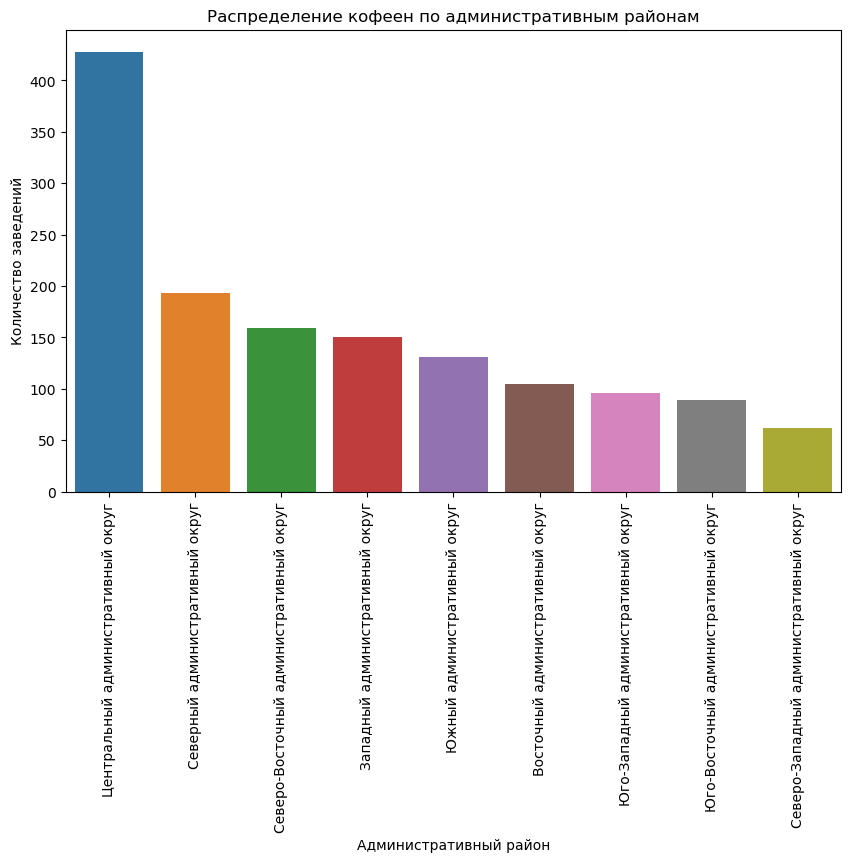

In [59]:
plt.figure(figsize=(10, 6))
sns.barplot(x = 'district', y = 'name', data = coffee_district)
plt.title('Распределение кофеен по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

Посмотрим расположение на карте.

In [60]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = coffee_district,
    columns = ['district', 'name'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Количество кофеен по округам',
).add_to(m)

# выводим карту
m

In [61]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']], popup = f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis = 1)
 
# выводим карту
m

Наибольшее количество кофеен находится в Центральном административном округе (428).  
Наименьшее количество кофеен находится в Северо - Западном административном округе (62).

### Круглосуточные кофейни

Есть ли круглосуточные кофейни?

In [62]:
coffee_24 = coffee.pivot_table(index = 'is_24_7', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
coffee_24.columns = ['is_24_7', 'count']
coffee_24

,is_24_7,count
0,False,1354
1,True,59


В данных присутствует 59 круглосуточных кофеен.

Посмотрим процентное соотношение 

In [63]:
fig = go.Figure(data = [go.Pie(labels = coffee_24['is_24_7'], values = coffee_24['count'])])
fig.update_layout(title = 'Соотношение "круглосуточных" и "некруглосуточных" заведений')
fig.show()

Всего 4.18% составляют кофейни работающие круглосуточно.

Сделаем по ним срез.

In [64]:
coffee_24_7 = coffee[coffee['is_24_7'] == True]
coffee_24_7.sample(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,цена чашки капучино:235–335 ₽,NaN,285.0,сетевой,NaN,ленинградский проспект,True
4112,one and double,кофейня,"москва, площадь киевского вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.743048,37.564394,4.1,NaN,NaN,NaN,NaN,не сетевой,10.0,площадь киевского вокзала,True
5443,шоколадница,кофейня,"москва, зелёный проспект, 5/12с2",Восточный административный округ,"ежедневно, круглосуточно",55.749856,37.774652,4.1,NaN,NaN,NaN,NaN,сетевой,NaN,зелёный проспект,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,сетевой,25.0,ярославское шоссе,True
3987,гоголь-моголь,кофейня,"москва, гоголевский бульвар, 19",Центральный административный округ,"ежедневно, круглосуточно",55.747215,37.599005,4.5,средние,средний счёт:300–700 ₽,500.0,NaN,не сетевой,NaN,гоголевский бульвар,True
4916,шоколадница,кофейня,"москва, нижняя радищевская улица, 5, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.741845,37.653285,4.2,NaN,NaN,NaN,NaN,сетевой,100.0,нижняя радищевская улица,True
4088,шоколадница,кофейня,"москва, зубовский бульвар, 17, стр. 1",Центральный административный округ,"ежедневно, круглосуточно",55.736329,37.590706,4.2,средние,цена чашки капучино:239–274 ₽,NaN,256.0,сетевой,320.0,зубовский бульвар,True


Посмотрим теперь расположение круглосуточных кофеен по округам.

In [65]:
coffee_24_district = coffee_24_7.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
coffee_24_district

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


Посмотрим на карте.

In [66]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']], popup = f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis = 1)
 
# выводим карту
m

### Рейтинги

Какие у кофеен рейтинги?  
Как они распределяются по районам?

In [67]:
coffee_rating = coffee.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').sort_values(by = 'rating', ascending = False).reset_index()
coffee_rating.columns = ['district', 'rating']
round(coffee_rating, 2)

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


Посмотрим на карте.

In [68]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = coffee_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Рейтинг кофеен по округам',
).add_to(m)

# выводим карту
m

Рейтинги не сильно отличаются в разных административных округах (4.20 - 4.34).

### Чашка капучино

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Посмотрим среднюю стоимость по округам.

In [69]:
coffee_cup = coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
coffee_cup

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [70]:
# создаём карту Москвы
m = Map(location = [moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data = state_geo,
    data = coffee_cup,
    columns = ['district', 'middle_coffee_cup'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Стоимость чашки капучино по округам',
).add_to(m)

# выводим карту
m

Самая большая стоимость кружки капучино в Юго - Западном (198р) и Центральном (190р) административных округах.  
Самая маленькая стоимость кружки капучино в Юго - Восточном (147.5р) и Восточном (135р) административных округах.

**Рекомендация**:  
Кофейню лучше открывать в Северо - Западном административном округе так как там меньше всего кофеен, достаточно конкурентные цены на чашку капучино и почти самые высокие рейтинги. Конкретное место нужно выбирать где есть высокая проходимость - станции метро, деловые и торговые центры и т.д..

Презентация: https://drive.google.com/file/d/19Cu1yRu15eavptWKaVu5nxQyks5Rysgm/view?usp=sharing